# <center>psyplot, unstructured grids and 3D visualization</center>

<div>
    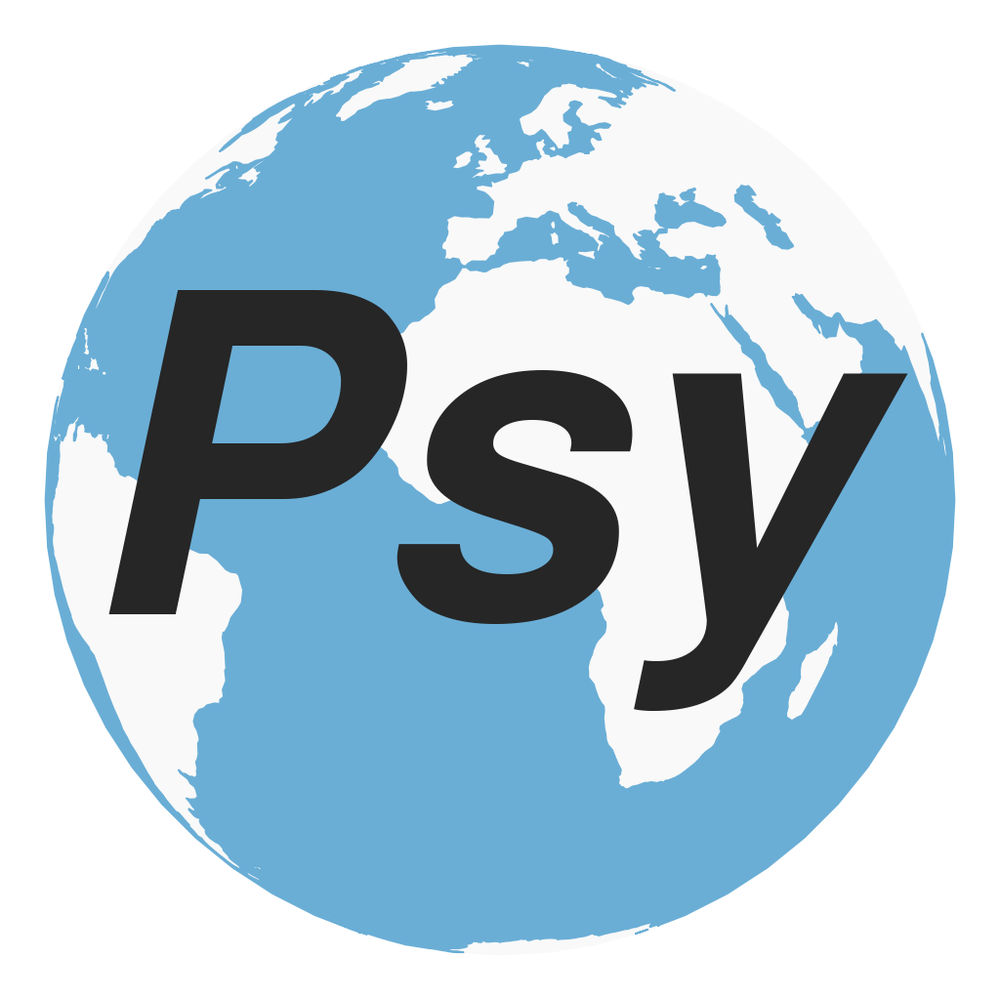
</div>

## AK Viewer Workshop

Philipp S. Sommer

Helmholtz-Zentrum Hereon

Helmholtz Coastal Data Center

April 12th, 2021

[Help](#/2/0)

## Technical Note <a id='help'></a>

This presentation is a jupyter notebook presented with [rise][rise] for interactive execution of the cells.
You can run it interactively on mybinder in your browser: 

[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/Chilipp/psyplot-KS-Seminar-20210228/main?filepath=psyplot-framework-presentation.ipynb)

The link to the repo on Github (https://github.com/Chilipp/psyplot-O2A-Jourfix-20210224) will be put onto the confluence page.

[Back to first slide](#/0/0)

[rise]: https://rise.readthedocs.io

So let's import some libraries for the execution

In [1]:
%matplotlib widget

import psyplot.project as psy

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
from IPython.display import display, Video, YouTubeVideo

from ipympl.backend_nbagg import Canvas
Canvas.header_visible.default_value = False

import pyvista
pyvista.rcParams['use_ipyvtk'] = True

import warnings
warnings.filterwarnings("ignore", r"\s*The on_mappable_changed")
warnings.filterwarnings("ignore", r"\s*The input coordinates")
warnings.filterwarnings("ignore", r"\s*shading=")
warnings.filterwarnings("ignore", r"\s*\[Warning by")

## Outline

#### Why psyplot? (and why for 3D?)

#### Main features of psyplot

#### Potentials for 3D

#### Discussion

### Note:

1. I am not a visualization expert

2. The aim of this talk is not to show wonderful plots but to discuss technical potentials

## It's all about a quick look into the data

<table>
    <tr>
        <th>ncview</th>
        <th>ArcGIS</th>
    </tr>
    <tr>
        <td>
            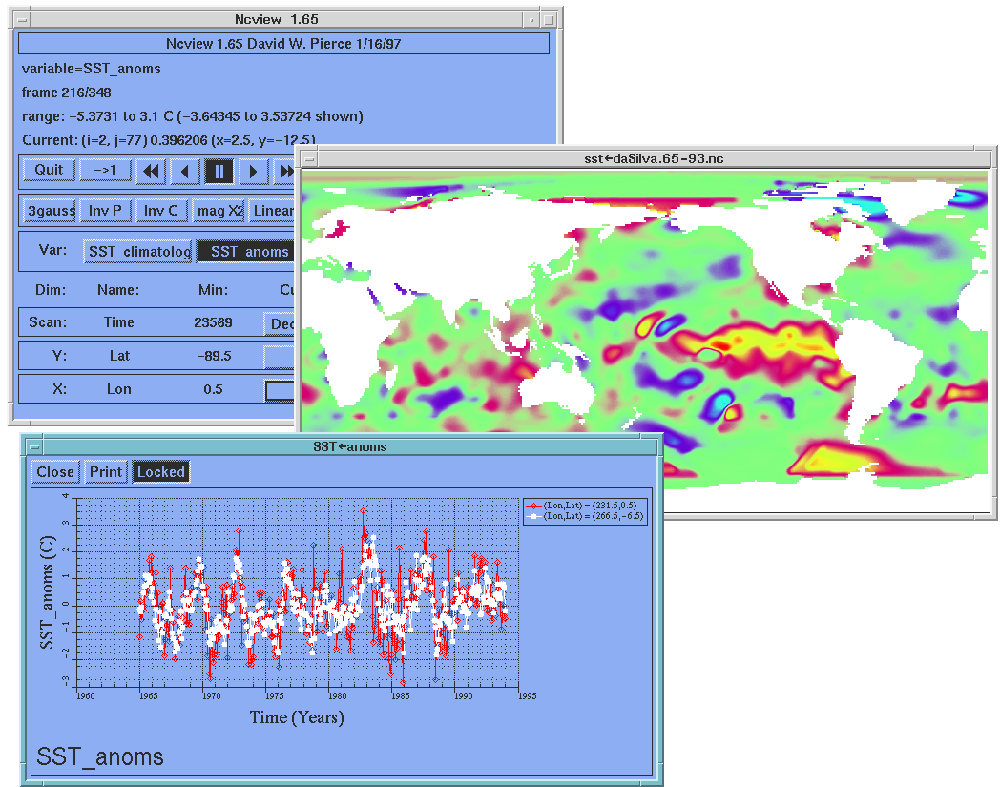
        </td>
        <td>
            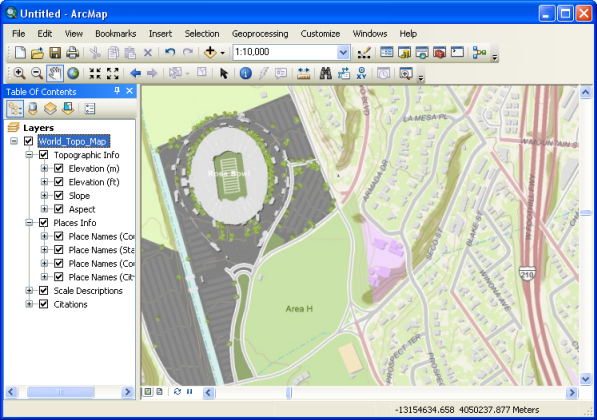
        </td>
    </tr>
    <tr>
        <th>Panoply</th>
        <th>Paraview</th>
    </tr>
    <tr>
        <td>
            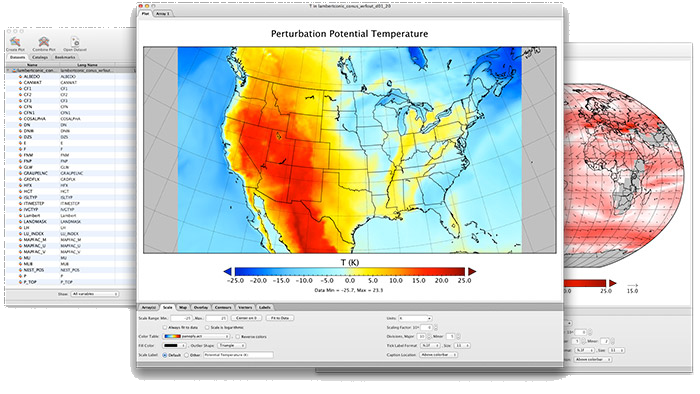
        </td>
        <td>
            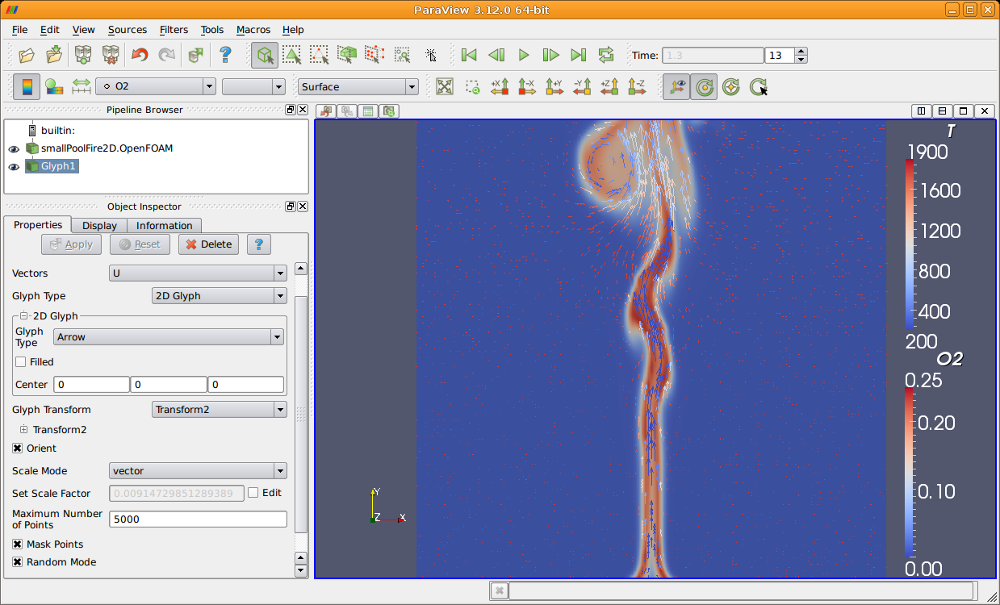
        </td>
    </tr>
</table>
    



Current tools either focus on

- Data visualization (ncview, Panoply, Paraview, etc.)
- data processing (Python, R)

There is no solution available that

- Is (easily) scriptable
- And has a Graphical User Interface
- Treats data processing and visualization hand in hand

<h2 class="section-heading">psyplot at a glance</h2>

## Using the GUI

### psy-view 

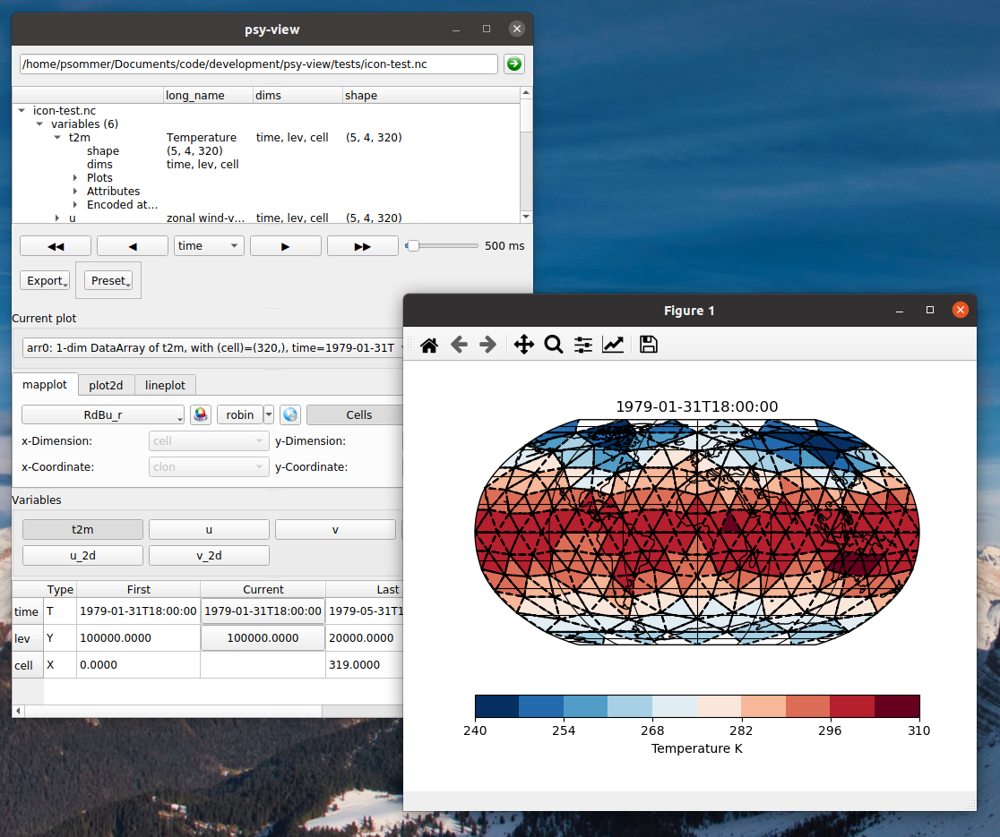

### The psyplot GUI

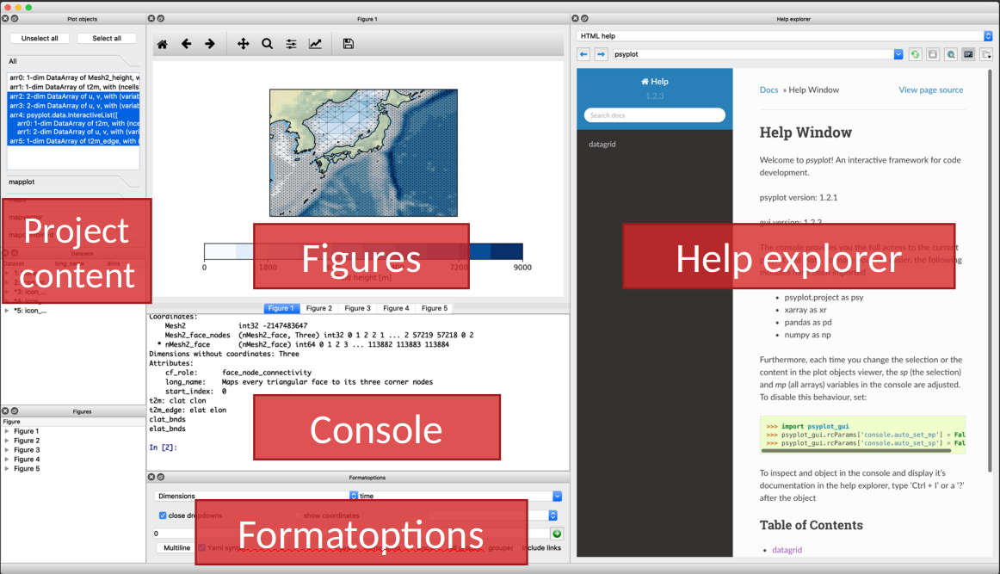

## Using psyplot from Python

In [2]:
ds = psy.open_dataset("data/icon_grid_demo.nc")
ds

<xarray.Dataset>
Dimensions:    (edge: 480, lev: 4, ncells: 5120, no: 4, time: 5, vertices: 3)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-31T18:00:00 ... 1979-05-31T18:00:00
    clon       (ncells) float64 ...
    clon_bnds  (ncells, vertices) float64 ...
    clat       (ncells) float64 ...
    clat_bnds  (ncells, vertices) float64 ...
    elon       (edge) float32 ...
    elon_bnds  (edge, no) float32 ...
    elat       (edge) float32 ...
    elat_bnds  (edge, no) float32 ...
  * lev        (lev) float64 1e+05 8.5e+04 5e+04 2e+04
Dimensions without coordinates: edge, ncells, no, vertices
Data variables:
    t2m        (time, lev, ncells) float32 ...
    u          (time, lev, ncells) float32 ...
    v          (time, lev, ncells) float32 ...
    t2m_edge   (time, lev, edge) float32 ...
Attributes:
    CDI:                  Climate Data Interface version 1.9.1 (http://mpimet...
    Conventions:          CF-1.4
    history:              Thu Aug 30 21:54:23 2018: cdo delname,t2m_2d,u_2d,v...
    number_of_grid_used:  42
    uuidOfHGrid:          bf575ad8-daa6-11e7-a4a9-93d511f821b4
    title:                Temperature and Wind demo-File for python nc2map mo...
    CDO:                  Climate Data Operators version 1.9.1 (http://mpimet...

In [3]:
sp = ds.psy.plot.mapplot(
    name="t2m",
)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## Working interactively from the command line

In [4]:
sp = ds.psy.plot.mapplot(
    name="t2m", cmap="Blues",
)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [5]:
sp.update(cmap="Reds")

In [6]:
sp.update(title="%(time)s")

In [7]:
sp.update(time=3)

In [8]:
sp.update(lonlatbox="Europe")

In [9]:
psy.close("all")

<h2 class="section-heading">More background:<br>An introduction into the psyplot framework</h2>

## The psyplot data model

![formatoptions](figures/formatoptions.png)

- `Formatoption`: The smallest possible unit. Each formatoption controls one aspect of the plot (cmap, lonlatbox, etc.)
- `Plotter`: A set of formatoptions that visualizes data

## The psyplot data model

![image.png](figures/dataarray.png)

- `Formatoption`: The smallest possible unit. Each formatoption controls one aspect of the plot (cmap, lonlatbox, etc.)
- `Plotter`: A set of formatoptions that visualizes data

- `DataArray`: Standard `xarray`
- `InteractiveList`: A collection of `DataArray`s that are visualized by one plotter (e.g. a collection of lines)

## The psyplot data model

![image.png](figures/project.png)

- `Formatoption`: The smallest possible unit. Each formatoption controls one aspect of the plot (cmap, lonlatbox, etc.)
- `Plotter`: A set of formatoptions that visualizes data

- `DataArray`: Standard `xarray`
- `InteractiveList`: A collection of `DataArray`s that are visualized by one plotter (e.g. a collection of lines)

- `Project`: A set of data objects, each visualized by one plotter
- `Sub project`: A subset of a larger `Project`

## The psyplot data model

![image.png](figures/framework.png)

- `Formatoption`: The smallest possible unit. Each formatoption controls one aspect of the plot (cmap, lonlatbox, etc.)
- `Plotter`: A set of formatoptions that visualizes data

- `DataArray`: Standard `xarray`
- `InteractiveList`: A collection of `DataArray`s that are visualized by one plotter (e.g. a collection of lines)

- `Project`: A set of data objects, each visualized by one plotter
- `Sub project`: A subset of a larger `Project`

## The psyplot data model in action

In [10]:
sp = (           # the subproject 
    psy.plot.mapplot(    # the plot method
        "data/icon_grid_demo.nc",
        name="t2m",      # variable name
        time=0,          # dimension infos
        title="title",   # a formatoption
    )
)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [11]:
sp[0]              # the DataArray

<xarray.DataArray 't2m' (ncells: 5120)>
array([268.0231 , 267.82184, 270.76376, ..., 284.9598 , 281.40765, 285.71848],
      dtype=float32)
Coordinates:
    time     datetime64[ns] 1979-01-31T18:00:00
    clon     (ncells) float64 0.6283 0.5623 0.6283 ... 0.1454 0.2085 0.2409
    clat     (ncells) float64 0.9184 0.9399 0.8735 ... -0.7121 -0.7751 -0.7038
    lev      float64 1e+05
  * ncells   (ncells) int64 0 1 2 3 4 5 6 ... 5113 5114 5115 5116 5117 5118 5119
Attributes:
    long_name:                    Temperature
    units:                        K
    code:                         130
    table:                        128
    CDI_grid_type:                unstructured
    number_of_grid_in_reference:  1

In [12]:
sp[0].psy.plotter  # the plotter

{'levels': None,
 'interp_bounds': None,
 'plot': 'mesh',
 'miss_color': None,
 'background': 'rc',
 'transpose': False,
 'projection': 'cf',
 'transform': 'cf',
 'clon': None,
 'clat': None,
 'lonlatbox': None,
 'lsm': {'res': '110m', 'linewidth': 1.0, 'coast': 'k'},
 'stock_img': False,
 'grid_color': 'k',
 'grid_labels': None,
 'grid_labelsize': 12.0,
 'grid_settings': {},
 'xgrid': False,
 'ygrid': False,
 'map_extent': None,
 'datagrid': None,
 'clip': None,
 'cmap': 'viridis',
 'bounds': [<BoundsMethod.rounded: 'rounded'>, None, 0.0, 100.0, None, None],
 'extend': 'neither',
 'cbar': {'b'},
 'clabel': '',
 'clabelsize': 'medium',
 'clabelweight': None,
 'cbarspacing': 'uniform',
 'clabelprops': {},
 'cticks': None,
 'cticklabels': None,
 'cticksize': 'medium',
 'ctickweight': None,
 'ctickprops': {},
 'mask_datagrid': True,
 'tight': False,
 'maskless': None,
 'maskleq': None,
 'maskgreater': None,
 'maskgeq': None,
 'maskbetween': None,
 'mask': None,
 'title': 'title',
 'titles

## More information?

Watch the DKRZ TechTalk on youtube and view the slides on Github:

https://github.com/Chilipp/psyplot-DKRZ-TechTalk-20201117

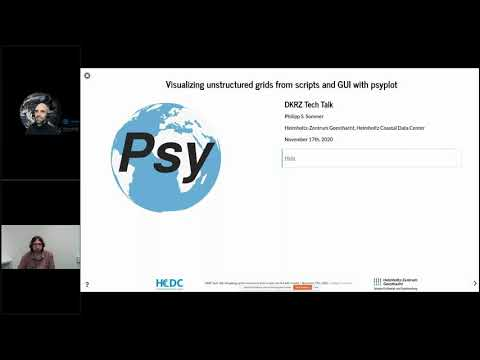

In [13]:
from IPython.display import YouTubeVideo
YouTubeVideo("DYsCQbZbtV0")

<h2 class="section-heading">Grid types</h2>
<center><h3>Visualizing the data on its native grid</h3></center>

## Starting simple: Rectilinear

- Standard lat-lon file
- 2D array with 1D coordinates
- Grid cell boundaries are not part of the file
  - xarray (and psyplot) interpolate them
  - matplotlib, too ([since 3.3.0][changelog])

<dl>
    <dt style="clear: left;">xarray</dt>
    <dd><code>ds.t2m.plot()</code></dd>
    <dt style="clear: left;">psyplot</dt>
    <dd><code>ds.t2m.psy.plot.mapplot()</code></dd>
    <dt style="clear: left;">matplotlib</dt>
    <dd><code>plt.pcolormesh(ds.lon, ds.lat, ds.t2m)</code></dd>
</dl>

[changelog]: https://matplotlib.org/3.3.1/users/whats_new.html#pcolor-and-pcolormesh-now-accept-shading-nearest-and-auto

In [14]:
psy.plot.mapplot(
    "data/rectilinear.nc", datagrid="k-", 
    map_extent="Europe"
);

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## Getting more complex: Curvilinear

- 2D variable
- 2D coordinates

---
- Eventually 3D bounds variable

---
not (well) supported by standard matplotlib and cartopy approach

In [15]:
psy.plot.mapplot(
    "data/curvilinear.nc",
    map_extent="United Kingdom|Italy",
    stock_img=True,
    datagrid='k-', plot=None
);

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## Unstructured Grids

<table style="width: 100%;">
    <tr>
        <th style="width: 50%; text-align: center">ICON</th>
        <th style="width: 50%; text-align: center">UGRID</th>
    </tr>
</table>

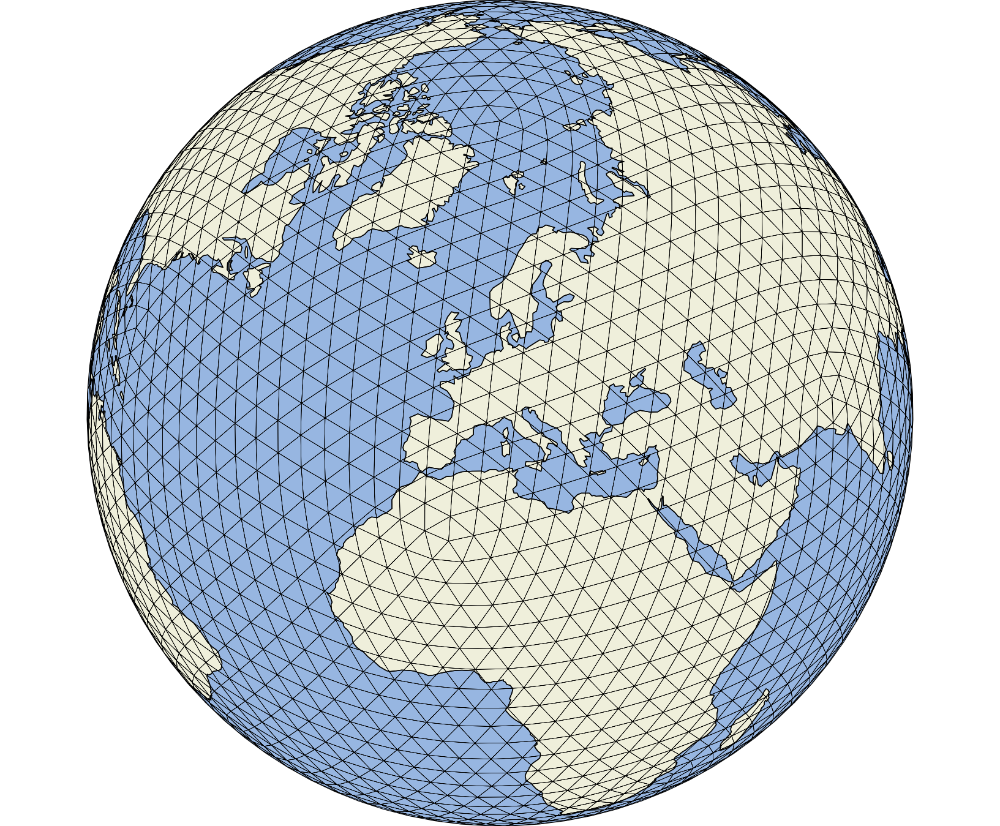

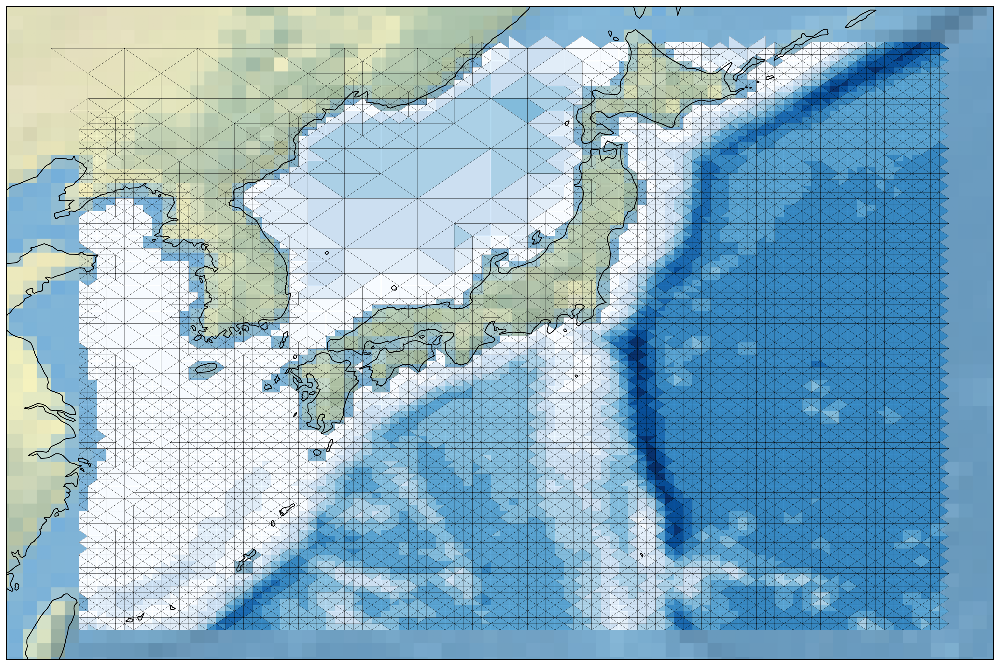

## Triangular and Edge grids


<table style="width: 100%;">
    <tr>
        <th style="width: 50%; text-align: center">triangular</th>
        <th style="width: 50%; text-align: center">edge grid</th>
    </tr>
</table>

In [16]:
# courtesy of Ralf Müller, MPI-M
psy.plot.mapplot(
    "data/icon.nc", datagrid="k-", map_extent="Europe"
);

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [17]:
# courtesy of Ralf Müller, MPI-M
psy.plot.mapplot(
    "data/icon-edge.nc", datagrid="k-", map_extent="Europe"
);

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## Triangular mesh

In [18]:
psy.plot.mapplot(
    "data/simple_triangular_grid_si0.nc", ax=(1, 2), title="Variable Location: %(location)s", datagrid="r-"
);

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## Flexible meshes

In [19]:
psy.plot.mapplot(
    "data/simple_flexible_grid_si0.nc", ax=(1, 2), title="Variable Location: %(location)s", datagrid="r-"
);

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [20]:
psy.close("all")

## Other features of psyplot

- Saving and loading projects
- Export plots in various formats
- Generate plots from the command line (e.g. in a bash script)

<h2 class="section-heading">3D visualization</h2>

## Combine VTK with psyplot

In [21]:
import psy_vtk.plotters as pvtk

ds = psy.open_dataset('data/icon.nc')

globe_plot = pvtk.GlobePlotter(ds.psy.t2m)
disp = globe_plot.ax.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

pyvista combines the power and efficiency of the (pretty difficult) VTK python bindings with a well-documented interface and matplotlib-like functionalities.

And it can even work with psyplot pretty much out of the box!

In [22]:
globe_plot.update(cmap='Reds')

In [23]:
globe_plot.update(datagrid=True)

## Immediate support of all grids

In [24]:
ds = psy.open_dataset('data/rectilinear.nc')

globe_plot = pvtk.GlobePlotter(ds.psy.t2m)
globe_plot.ax.show();

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [25]:
ds = psy.open_dataset('data/curvilinear.nc')

globe_plot = pvtk.GlobePlotter(ds.psy.t2m)
globe_plot.ax.show();

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Visualizing big data

Coming back to our 4.4 million cells:

psy-vtk needs a couple of seconds to visualize it and it works fluently.

Come back to me if you are interested in a collaboration.

In [26]:
Video("data/screencast.mp4", embed=True, html_attributes="autoplay loop")

## Pros and Cons for implementing 3D visualization with psyplot

#### Pros

- introduce scientists to 3D visualization and data exploration through
    - interactive GUI
    - scripts using python or bash
- designed to be flexible and sustainable
- supports multiple grid types
- built upon libraries and methods that many scientists use
- Usage for the web:
    - export to vtkjs
    - Jupyter notebooks

#### Cons

- yet another 3D visualization framework?
- What are the things that should be implemented?
- I already have enough to do
- I am not a 3D visualization expert